In [1]:
import datetime                           # a lirbary that supports the creation of date objects
import os                                 # a library that allows us access to basic operating system commands like making directories
from pathlib import Path                  # a library that helps construct system path objects
import shutil                             # a library that allows us access to basic operating system commands like copy
import eumdac                             # a tool that helps us download via the eumetsat/data-store
import xarray as xr                       # a library that supports the use of multi-dimensional arrays in Python
import matplotlib.pyplot as plt           # a library that support plotting
import numpy as np                        # a library that provides support for array-based mathematics
import eumartools                         # a EUMETSAT library that support working with Sentinel-3 products
from shapely import geometry, vectorized  # a library that supports the creation of shape objects, like polygons

In [2]:
download_dir = os.path.join(os.getcwd(), "products")
os.makedirs(download_dir, exist_ok=True)

In [3]:
# load credentials
credentials_file = os.path.join(os.path.expanduser("~"),'.eumdac','credentials')
credentials = Path(credentials_file).read_text().split(',')
token = eumdac.AccessToken((credentials[0], credentials[1]))
print(f"This token '{token}' expires {token.expiration}")

# create data store object
datastore = eumdac.DataStore(token)

This token '480c8108-0a12-3878-b88b-8ce0be632071' expires 2024-03-21 08:21:49.308052


In [4]:
datastore = eumdac.DataStore(token)
for collection_id in datastore.collections:
    try:
        if "OLCI" in collection_id.title and "EO:EUM:DAT:0" in str(collection_id):
            print(f"Collection ID({collection_id}): {collection_id.title}")
    except:
        pass

Collection ID(EO:EUM:DAT:0410): OLCI Level 1B Reduced Resolution - Sentinel-3
Collection ID(EO:EUM:DAT:0408): OLCI Level 2 Ocean Colour Reduced Resolution - Sentinel-3
Collection ID(EO:EUM:DAT:0409): OLCI Level 1B Full Resolution - Sentinel-3
Collection ID(EO:EUM:DAT:0407): OLCI Level 2 Ocean Colour Full Resolution - Sentinel-3
Collection ID(EO:EUM:DAT:0556): OLCI Level 2 Ocean Colour Full Resolution (version BC003) - Sentinel-3 - Reprocessed
Collection ID(EO:EUM:DAT:0557): OLCI Level 2 Ocean Colour Reduced Resolution (version BC003) - Sentinel-3 - Reprocessed
Collection ID(EO:EUM:DAT:0577): OLCI Level 1B Full Resolution (version BC002) - Sentinel-3 - Reprocessed
Collection ID(EO:EUM:DAT:0578): OLCI Level 1B Reduced Resolution (version BC002) - Sentinel-3 - Reprocessed


In [5]:
collectionID = 'EO:EUM:DAT:0409'

In [7]:
# space/time filter the collection for products
selected_collection = datastore.get_collection(collectionID)
start = datetime.datetime(2024, 1, 7, 0, 0)
end = datetime.datetime(2024, 1, 8, 23, 59)
# spatial filtering
lonmin = -74.3229
lonmax = -72.0978
latmin = -37.4965
latmax = -35.7416
roi = [[lonmin, latmin], [lonmin, latmax], [lonmax, latmax], [lonmax, latmin], [lonmin, latmin]]

products = selected_collection.search(
    geo='POLYGON(({}))'.format(','.join(["{} {}".format(*coord) for coord in roi])),
    dtstart=start, 
    dtend=end)

for product in products:
    print(product)

S3A_OL_1_EFR____20240108T143630_20240108T143930_20240109T174037_0179_107_324_3600_MAR_O_NT_002.SEN3
S3B_OL_1_EFR____20240108T135730_20240108T140030_20240109T155943_0180_088_181_3600_MAR_O_NT_002.SEN3
S3B_OL_1_EFR____20240107T142341_20240107T142641_20240108T164211_0179_088_167_3600_MAR_O_NT_002.SEN3


In [9]:
for product in products:
    # this gets our files....
    with product.open() as fsrc, open(os.path.join(download_dir, fsrc.name), mode='wb') as fdst:
        print(f'Downloading {fsrc.name}')
        shutil.copyfileobj(fsrc, fdst)
        print(f'Download of product {fsrc.name} finished.')

Download of product S3A_OL_1_EFR____20240108T143630_20240108T143930_20240109T174037_0179_107_324_3600_MAR_O_NT_002.SEN3.zip finished.
Download of product S3B_OL_1_EFR____20240108T135730_20240108T140030_20240109T155943_0180_088_181_3600_MAR_O_NT_002.SEN3.zip finished.
Download of product S3B_OL_1_EFR____20240107T142341_20240107T142641_20240108T164211_0179_088_167_3600_MAR_O_NT_002.SEN3.zip finished.


In [1]:
# library imports
import cartopy.crs as ccrs          # a library that support mapping
import glob                         # a library that aids in searching for files
import matplotlib.pyplot as plt     # a library that support plotting
import matplotlib.ticker as mticker # a library that extends plotting support
import numpy as np                  # a library that provides support for array-based mathematics
import os                           # a library that allows us access to basic operating system commands
import warnings                     # a library that helps us manage warnings
import xarray as xr                 # a library that supports the use of multi-dimensional arrays in Python
import eumartools                   # a EUMETSAT library that support working with Sentinel-3 products
warnings.filterwarnings('ignore')

In [2]:
# selecting SAFE directory
SAFE_directory = os.path.join(os.getcwd(), 'products', 
    'S3A_OL_1_EFR____20240108T143630_20240108T143930_20240109T174037_0179_107_324_3600_MAR_O_NT_002.SEN3/S3A_OL_1_EFR____20240108T143630_20240108T143930_20240109T174037_0179_107_324_3600_MAR_O_NT_002.SEN3')

In [3]:
SAFE_directory

'/home/cl4/Downloads/Project/products/S3A_OL_1_EFR____20240108T143630_20240108T143930_20240109T174037_0179_107_324_3600_MAR_O_NT_002.SEN3/S3A_OL_1_EFR____20240108T143630_20240108T143930_20240109T174037_0179_107_324_3600_MAR_O_NT_002.SEN3'

In [4]:
grid_reduce = 3
band_vars = xr.open_mfdataset(glob.glob(os.path.join(SAFE_directory,'Oa*.nc')))
band_dict = {}
bands_needed = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 17]

for band_var in band_vars:
    band_num = int(band_var.split('_')[0][2:])
    if band_num not in bands_needed:
        print(f"Skipping: {band_var}, as we don't need it for now")
    else:
        print(f"Reading:  {band_var}")
        band_dict[band_var] = band_vars[band_var].data[::grid_reduce,::grid_reduce]

band_vars.close()

Reading:  Oa01_radiance
Reading:  Oa02_radiance
Reading:  Oa03_radiance
Reading:  Oa04_radiance
Reading:  Oa05_radiance
Reading:  Oa06_radiance
Reading:  Oa07_radiance
Reading:  Oa08_radiance
Reading:  Oa09_radiance
Reading:  Oa10_radiance
Reading:  Oa11_radiance
Skipping: Oa12_radiance, as we don't need it for now
Skipping: Oa13_radiance, as we don't need it for now
Skipping: Oa14_radiance, as we don't need it for now
Skipping: Oa15_radiance, as we don't need it for now
Skipping: Oa16_radiance, as we don't need it for now
Reading:  Oa17_radiance
Skipping: Oa18_radiance, as we don't need it for now
Skipping: Oa19_radiance, as we don't need it for now
Skipping: Oa20_radiance, as we don't need it for now
Skipping: Oa21_radiance, as we don't need it for now


In [5]:
# Natural colour single band
red_recipe = band_dict['Oa08_radiance']
green_recipe = band_dict['Oa06_radiance']
blue_recipe = band_dict['Oa02_radiance']

rgb_nat = np.dstack((red_recipe, green_recipe, blue_recipe))
rgb_nat_norm = eumartools.normalise_image(rgb_nat)

In [6]:
# Tristimulus
red_recipe = np.log10(1.0 + 0.01 * band_dict['Oa01_radiance'] + 0.09 * band_dict['Oa02_radiance'] 
                      + 0.35 * band_dict['Oa03_radiance'] + 0.04 * band_dict['Oa04_radiance'] 
                      + 0.01 * band_dict['Oa05_radiance'] + 0.59 * band_dict['Oa06_radiance'] 
                      + 0.85 * band_dict['Oa07_radiance'] + 0.12 * band_dict['Oa08_radiance'] 
                      + 0.07 * band_dict['Oa09_radiance'] + 0.04 * band_dict['Oa10_radiance'])
green_recipe = np.log10(1.0 + 0.26 * band_dict['Oa03_radiance'] + 0.21 * band_dict['Oa04_radiance'] 
                        + 0.50 * band_dict['Oa05_radiance'] + band_dict['Oa06_radiance'] 
                        + 0.38 * band_dict['Oa07_radiance'] + 0.04 * band_dict['Oa08_radiance'] 
                        + 0.03 * band_dict['Oa09_radiance'] + 0.02 * band_dict['Oa10_radiance'])
blue_recipe = np.log10(1.0 + 0.07 * band_dict['Oa01_radiance'] + 0.28 * band_dict['Oa02_radiance'] 
                       + 1.77 * band_dict['Oa03_radiance'] + 0.47 * band_dict['Oa04_radiance'] 
                       + 0.16 * band_dict['Oa05_radiance'])

rgb_tri = np.dstack((red_recipe, green_recipe, blue_recipe))
rgb_tri_norm = eumartools.normalise_image(rgb_tri)

In [7]:
# Natural colour broad band, log scaled
red_recipe = 0.16666 * band_dict['Oa09_radiance'] + 0.66666 * band_dict['Oa09_radiance'] \
             + 0.08333 * band_dict['Oa10_radiance'] + 0.08333 * band_dict['Oa11_radiance']
green_recipe = 0.16666 *  band_dict['Oa05_radiance'] + 0.66666 *  band_dict['Oa06_radiance'] \
               + 0.16666 *  band_dict['Oa07_radiance']
blue_recipe = 0.16666 *  band_dict['Oa02_radiance'] + 0.66666 *  band_dict['Oa03_radiance'] \
               + 0.16666 *  band_dict['Oa04_radiance']

rgb_log = np.dstack(((np.log10(red_recipe * 0.01) + 1.6516951369518393) / 1.9887713527138795,
                    (np.log10(green_recipe * 0.01) + 1.6516951369518393) / 1.9887713527138795,
                    (np.log10(blue_recipe * 0.01) + 1.6516951369518393) / 1.9887713527138795))
                     
rgb_log_norm = eumartools.normalise_image(rgb_log)

In [8]:
# False colour
red_recipe = band_dict['Oa17_radiance']
green_recipe = band_dict['Oa06_radiance']
blue_recipe = band_dict['Oa02_radiance']

rgb_fls = np.dstack((red_recipe, green_recipe, blue_recipe))
rgb_fls_norm = eumartools.normalise_image(rgb_fls)

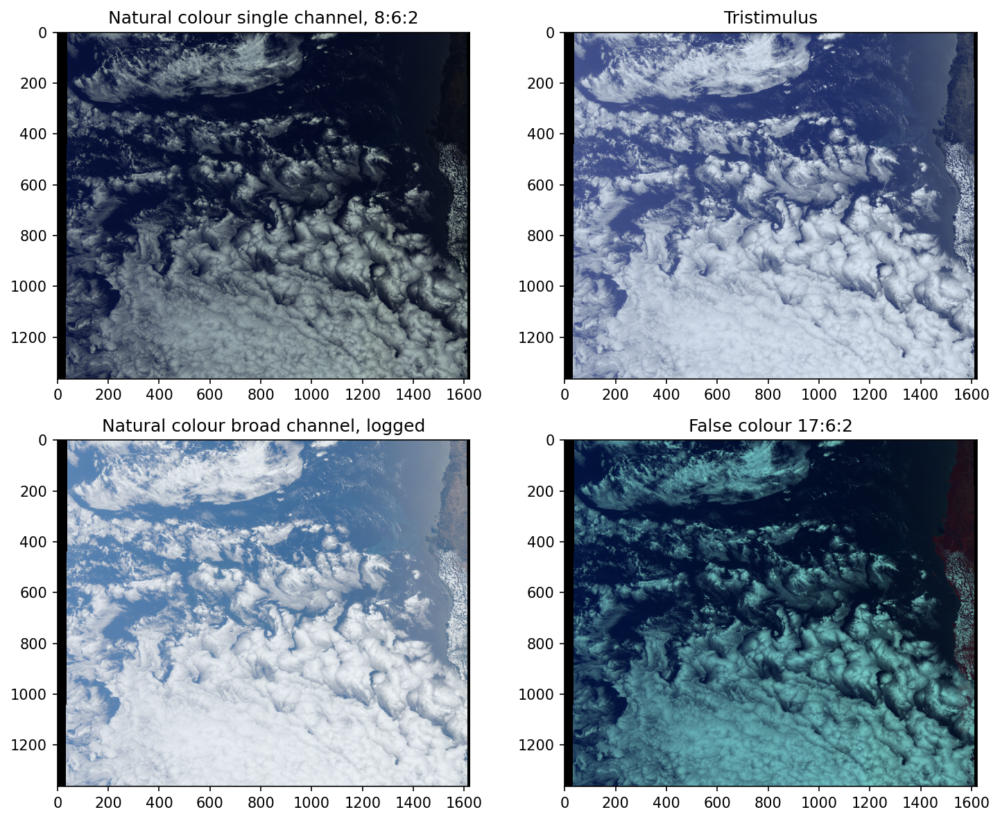

In [9]:
fig, axs = plt.subplots(2, 2, figsize=(10, 8), dpi=150)

axs[0,0].imshow(rgb_nat_norm); axs[0,0].title.set_text('Natural colour single channel, 8:6:2')
axs[0,1].imshow(rgb_tri_norm); axs[0,1].title.set_text('Tristimulus')
axs[1,0].imshow(rgb_log_norm); axs[1,0].title.set_text('Natural colour broad channel, logged')
axs[1,1].imshow(rgb_fls_norm); axs[1,1].title.set_text('False colour 17:6:2')

plt.tight_layout()

(1200.0, 1600.0)

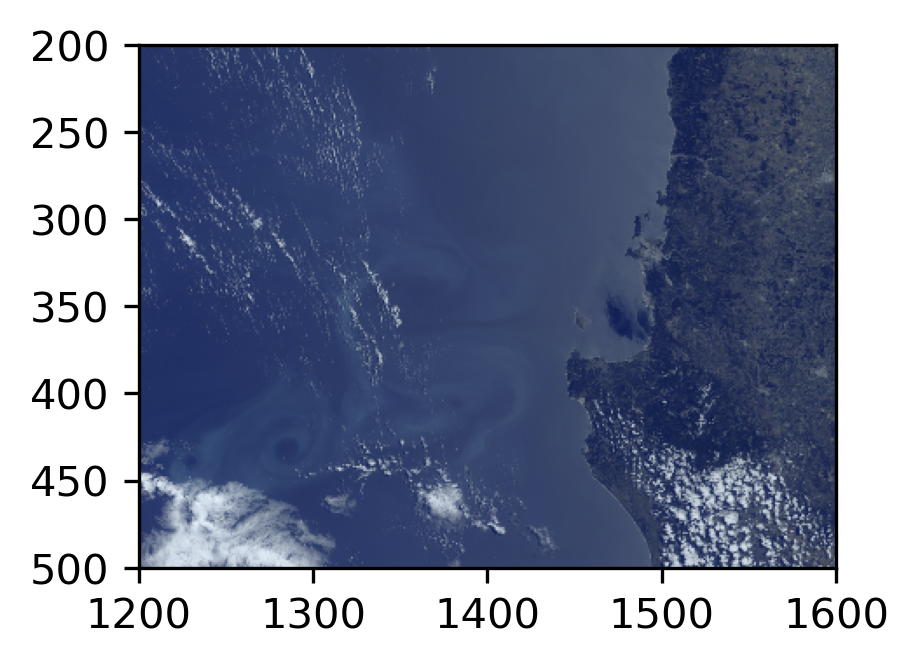

In [11]:
fig, axs = plt.subplots(1, 1, figsize=(3,3), dpi=300)
axs.imshow(rgb_tri_norm)
plt.ylim(500, 200)
plt.xlim(1200, 1600)

In [12]:
rgb_log_norm_unhitch = eumartools.normalise_image(rgb_log, unhitch=True)
rgb_log_norm_trunc = eumartools.truncate_image(rgb_log_norm, min_percentile=5.0, max_percentile=95.0)
rgb_log_norm_hist = eumartools.histogram_image(rgb_log_norm, nbins=512)

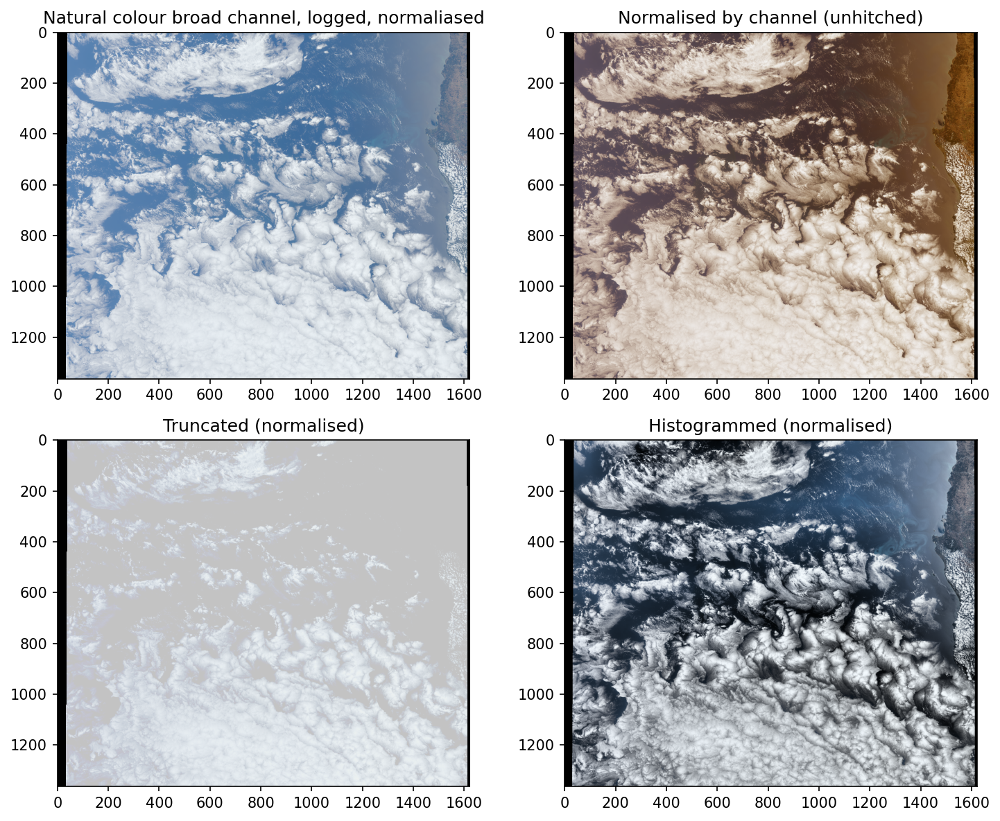

In [13]:
fig, axs = plt.subplots(2, 2, figsize=(10, 8), dpi=150)

axs[0,0].imshow(rgb_log_norm); axs[0,0].title.set_text('Natural colour broad channel, logged, normaliased')
axs[0,1].imshow(rgb_log_norm_unhitch); axs[0,1].title.set_text('Normalised by channel (unhitched)')
axs[1,0].imshow(rgb_log_norm_trunc); axs[1,0].title.set_text('Truncated (normalised)')
axs[1,1].imshow(rgb_log_norm_hist); axs[1,1].title.set_text('Histogrammed (normalised)')

plt.tight_layout()

(1200.0, 1600.0)

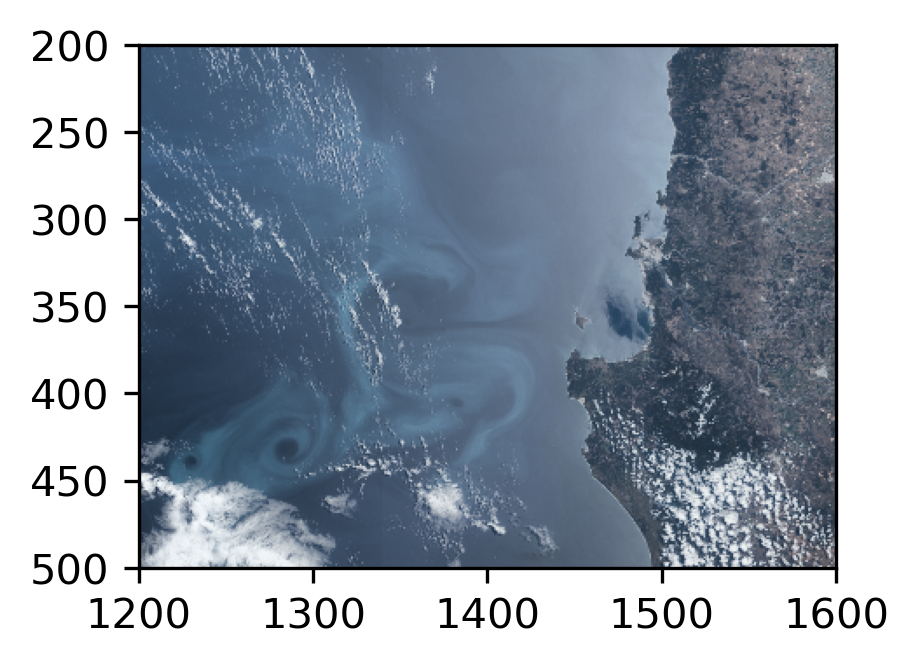

In [27]:
fig, axs = plt.subplots(1, 1, figsize=(3,3), dpi=300)
axs.imshow(rgb_log_norm_hist)
plt.ylim(500, 200)
plt.xlim(1200, 1600)

In [16]:
geo_file = os.path.join(SAFE_directory,'geo_coordinates.nc')
geo_vars = xr.open_dataset(geo_file)
lon = geo_vars.longitude.data[::grid_reduce,::grid_reduce]
lat = geo_vars.latitude.data[::grid_reduce,::grid_reduce]
geo_vars.close()

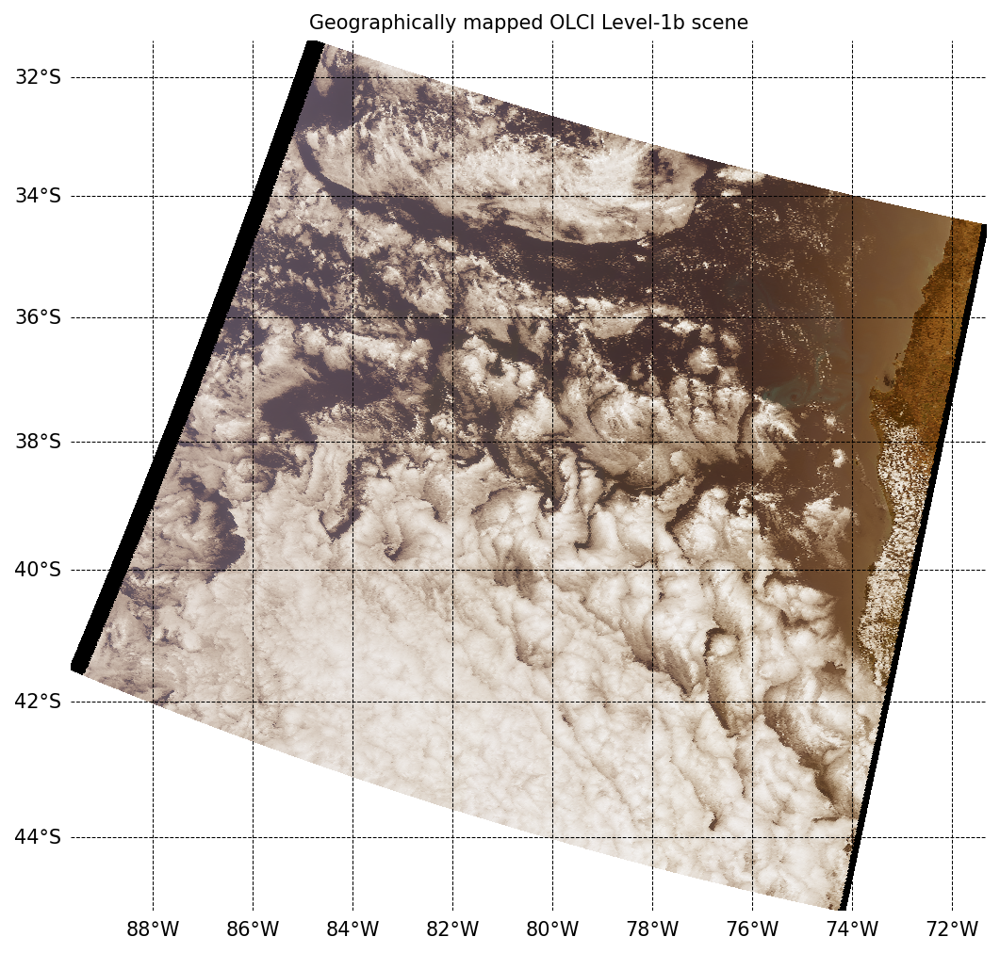

In [17]:
fig = plt.figure(figsize=(10, 8), dpi=150)
m = plt.subplot(projection=ccrs.Mercator())

# make the colour map
colorArray = np.array(rgb_log_norm_unhitch)
colorTuple = colorArray.reshape((colorArray.shape[0] * colorArray.shape[1]), 3)
colorTuple = np.insert(colorTuple, 3, 1.0, axis=1)

# make the map
m.pcolormesh(lon, lat, lon, color=colorTuple, edgecolors=None, transform=ccrs.PlateCarree())

# Embellish with gridlines
g1 = m.gridlines(draw_labels = True, zorder=20, color='k', linestyle='--',linewidth=0.5)
g1.xlocator = mticker.FixedLocator(np.arange(-180, 180, 2))
g1.ylocator = mticker.FixedLocator(np.arange(-90, 90, 2))
g1.top_labels = False
g1.right_labels = False
g1.xlabel_style = {'size': 10, 'color': 'black'}
g1.ylabel_style = {'size': 10, 'color': 'black'}
m.set(facecolor = "1.0")
m.axis('off')

plt.title('Geographically mapped OLCI Level-1b scene', fontsize=10)
plt.savefig('1_4_OLCI_RGB.png', bbox_inches='tight')
plt.show()

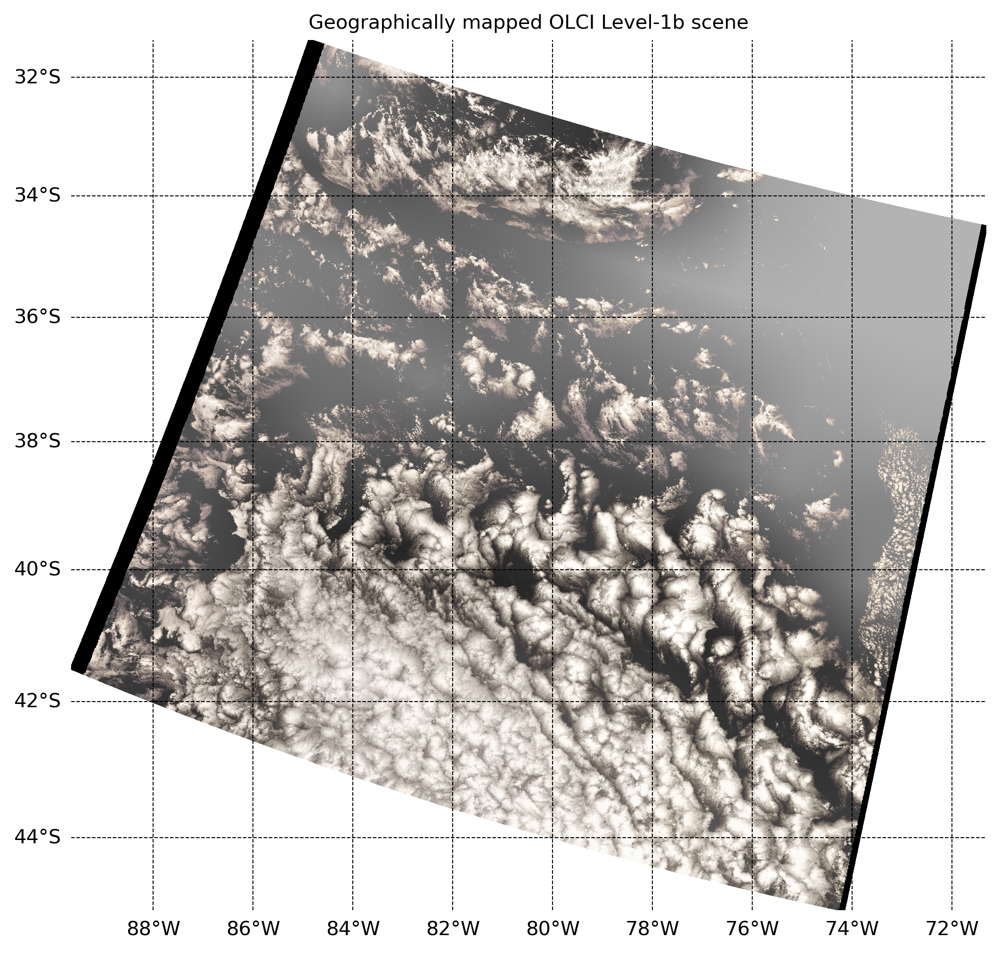

In [18]:
# first normalise by channel
rgb_log_norm_unhitch = eumartools.normalise_image(rgb_log, unhitch=True)
# then remove the outliers from the unhitched image
rgb_log_norm_unhitch_trunc = eumartools.truncate_image(rgb_log_norm_unhitch)
# then histogram the truncate image
rgb_log_final = eumartools.histogram_image(rgb_log_norm_unhitch_trunc, nbins=512)

# make the plot
fig = plt.figure(figsize=(10, 8), dpi=300)
m = plt.subplot(projection=ccrs.Mercator())

# make the colour map
colorArray = np.array(rgb_log_final)
colorTuple = colorArray.reshape((colorArray.shape[0] * colorArray.shape[1]), 3)
colorTuple = np.insert(colorTuple, 3, 1.0, axis=1)

# make the map
m.pcolormesh(lon, lat, lon, color=colorTuple, edgecolors=None, transform=ccrs.PlateCarree())

# Embellish with gridlines
g1 = m.gridlines(draw_labels = True, zorder=20, color='k', linestyle='--',linewidth=0.5)
g1.xlocator = mticker.FixedLocator(np.arange(-180, 180, 2))
g1.ylocator = mticker.FixedLocator(np.arange(-90, 90, 2))
g1.xlabels_top = False
g1.ylabels_right = False
g1.xlabel_style = {'size': 10, 'color': 'black'}
g1.ylabel_style = {'size': 10, 'color': 'black'}
m.set(facecolor = "1.0")
m.axis('off')

plt.title('Geographically mapped OLCI Level-1b scene', fontsize=10)
plt.show()

In [1]:
import datetime                           # a lirbary that supports the creation of date objects
import os                                 # a library that allows us access to basic operating system commands like making directories
from pathlib import Path                  # a library that helps construct system path objects
import shutil                             # a library that allows us access to basic operating system commands like copy
import eumdac                             # a tool that helps us download via the eumetsat/data-store
import xarray as xr                       # a library that supports the use of multi-dimensional arrays in Python
import matplotlib.pyplot as plt           # a library that support plotting
import numpy as np                        # a library that provides support for array-based mathematics
import eumartools                         # a EUMETSAT library that support working with Sentinel-3 products
from shapely import geometry, vectorized  # a library that supports the creation of shape objects, like polygons

In [2]:
download_dir = os.path.join(os.getcwd(), "products")

# load credentials
credentials_file = os.path.join(os.path.expanduser("~"),'.eumdac','credentials')
credentials = Path(credentials_file).read_text().split(',')
token = eumdac.AccessToken((credentials[0], credentials[1]))
print(f"This token '{token}' expires {token.expiration}")

# create data store object
datastore = eumdac.DataStore(token)

collectionID = 'EO:EUM:DAT:0407'
# space/time filter the collection for products
selected_collection = datastore.get_collection(collectionID)
start = datetime.datetime(2024, 1, 7, 0, 0)
end = datetime.datetime(2024, 1, 8, 23, 59)
# spatial filtering
lonmin = -74.3229
lonmax = -72.0978
latmin = -37.4965
latmax = -35.7416
roi = [[lonmin, latmin], [lonmin, latmax], [lonmax, latmax], [lonmax, latmin], [lonmin, latmin]]

products = selected_collection.search(
    geo='POLYGON(({}))'.format(','.join(["{} {}".format(*coord) for coord in roi])),
    dtstart=start, 
    dtend=end)

for product in products:
    print(product)

This token 'ff99b061-a0df-31cb-8f93-f4378abcdbb8' expires 2024-03-21 09:22:00.575197
S3A_OL_2_WFR____20240108T143630_20240108T143930_20240109T215118_0179_107_324_3600_MAR_O_NT_003.SEN3
S3B_OL_2_WFR____20240108T135730_20240108T140030_20240109T195850_0180_088_181_3600_MAR_O_NT_003.SEN3
S3B_OL_2_WFR____20240107T142341_20240107T142641_20240108T205019_0179_088_167_3600_MAR_O_NT_003.SEN3


In [3]:
for product in products:
    # this gets our files....
    with product.open() as fsrc, open(os.path.join(download_dir, fsrc.name), mode='wb') as fdst:
        print(f'Downloading {fsrc.name}')
        shutil.copyfileobj(fsrc, fdst)
        print(f'Download of product {fsrc.name} finished.')

Download of product S3A_OL_2_WFR____20240108T143630_20240108T143930_20240109T215118_0179_107_324_3600_MAR_O_NT_003.SEN3.zip finished.
Download of product S3B_OL_2_WFR____20240108T135730_20240108T140030_20240109T195850_0180_088_181_3600_MAR_O_NT_003.SEN3.zip finished.
Download of product S3B_OL_2_WFR____20240107T142341_20240107T142641_20240108T205019_0179_088_167_3600_MAR_O_NT_003.SEN3.zip finished.


S3A_OL_1_EFR____20240108T143630_20240108T143930_20240109T174037_0179_107_324_3600_MAR_O_NT_002.SEN3/S3A_OL_1_EFR____20240108T143630_20240108T143930_20240109T174037_0179_107_324_3600_MAR_O_NT_002.SEN3
S3A_OL_2_WFR____20240108T143630_20240108T143930_20240109T215118_0179_107_324_3600_MAR_O_NT_003.SEN3/S3A_OL_2_WFR____20240108T143630_20240108T143930_20240109T215118_0179_107_324_3600_MAR_O_NT_003.SEN3

OLCI radiance and reflectance spectra

In [1]:
# library imports
import glob                                             # a library that aids in searching for files
import inspect                                          # a library that lets us query function source code
import numpy as np                                      # a library that provides support for array-based mathematics
import os                                               # a library that allows us access to basic operating system commands like making directories
import warnings                                         # a library that helps us manage warnings
import xarray as xr                                     # a library that supports the use of multi-dimensional arrays in Python
import xml.etree.ElementTree as ET                      # a library that helps us parse XML files
import pandas as pd                                     # a library that provides analysis tools for time-series and dataframes
from bokeh.io import output_notebook, show, export_png  # a library that provides Bokeh plotting support
from bokeh.plotting import figure                       # a library that provides Bokeh plotting support
from bokeh.models import HoverTool, Range1d, LinearAxis # a library that provides Bokeh plotting support
from bokeh.layouts import row                           # a library that provides Bokeh plotting support
import eumartools                                       # a EUMETSAT library that support working with Sentinel-3 products
warnings.filterwarnings('ignore')

In [2]:
output_notebook()

Loading BokehJS ...

In [3]:
SAFE_directories = [
    os.path.join(os.getcwd(), 'products', 
    'S3A_OL_1_EFR____20240108T143630_20240108T143930_20240109T174037_0179_107_324_3600_MAR_O_NT_002.SEN3/S3A_OL_1_EFR____20240108T143630_20240108T143930_20240109T174037_0179_107_324_3600_MAR_O_NT_002.SEN3'),
    os.path.join(os.getcwd(), 'products',
    'S3A_OL_2_WFR____20240108T143630_20240108T143930_20240109T215118_0179_107_324_3600_MAR_O_NT_003.SEN3/S3A_OL_2_WFR____20240108T143630_20240108T143930_20240109T215118_0179_107_324_3600_MAR_O_NT_003.SEN3')
    ]

In [4]:
# set up data dictionary
data = {
        'rad':{
        'band_names': [],
        'band_centres': [],
        'band_widths': [],
        'means': [],
        'uppers': [],
        'lowers': []},
        
        'ref':{
        'band_names': [],
        'band_centres': [],
        'band_widths': [],
        'means': [],
        'uppers': [],
        'lowers': [],
        'errs': []}
        }

In [5]:
for SAFE_directory in SAFE_directories:

    if "_OL_1_" in SAFE_directory:
        tag = "rad"
    else:
        tag = "ref"
        
    tree = ET.parse(os.path.join(SAFE_directory,'xfdumanifest.xml'))
    root = tree.getroot()
    match = {"sentinel3":"http://www.esa.int/safe/sentinel/sentinel-3/1.0"}
    data[tag]["band_names"] = [item.attrib["name"] for item in root.findall('.//sentinel3:band', match)]
    data[tag]["band_centres"] = [float(item.text) for item in root.findall('.//sentinel3:centralWavelength', match)]
    data[tag]["band_widths"] = [float(item.text) for item in root.findall('.//sentinel3:bandwidth', match)]

In [6]:
# makes area average
lons = [ -74.4015, -74.4015, -73.8044, -73.8044, -74.4015]
lats = [-37.3565, -36.8856, -36.8856, -37.3565, -37.3565]

# for minimap plotting only
grid_reduce = 5

In [7]:
geo_file = os.path.join(SAFE_directories[0],'geo_coordinates.nc')
geo_vars = xr.open_dataset(geo_file)
lon = geo_vars.longitude.data[::grid_reduce, ::grid_reduce]
lat = geo_vars.latitude.data[::grid_reduce, ::grid_reduce]
geo_vars.close()

In [8]:
ex, ey, mask = eumartools.subset_image(lon, lat, lons, lats)
mask = mask.T

In [9]:
RGB_dict = {}
# read everything we need from netcdf
for SAFE_directory in SAFE_directories:

    if "_OL_1_" in SAFE_directory:
        tag = "rad"
    else:
        tag = "ref"
        
    # open all the files at once
    band_vars = xr.open_mfdataset(glob.glob(os.path.join(SAFE_directory,'Oa*.nc')))
    for band_var in band_vars:
        print(f"Reading:  {band_var}")
        var = band_vars[band_var].data[::grid_reduce, ::grid_reduce]*mask
        if "_err" in band_var:
            data[tag]["errs"].append(np.array(np.nanmean(var)))
        else:
            data[tag]["means"].append(np.array(np.nanmean(var)))
            data[tag]["uppers"].append(np.array(np.nanmean(var) + np.nanstd(var)))
            data[tag]["lowers"].append(np.array(np.nanmean(var) - np.nanstd(var)))
            if "Oa08_radiance" in band_var or "Oa06_radiance" in band_var or "Oa02_radiance" in band_var:
                    # this is just to build our quick minimap
                    RGB_dict[band_var] = band_vars[band_var].data[::grid_reduce, ::grid_reduce]

    band_vars.close()

Reading:  Oa01_radiance
Reading:  Oa02_radiance
Reading:  Oa03_radiance
Reading:  Oa04_radiance
Reading:  Oa05_radiance
Reading:  Oa06_radiance
Reading:  Oa07_radiance
Reading:  Oa08_radiance
Reading:  Oa09_radiance
Reading:  Oa10_radiance
Reading:  Oa11_radiance
Reading:  Oa12_radiance
Reading:  Oa13_radiance
Reading:  Oa14_radiance
Reading:  Oa15_radiance
Reading:  Oa16_radiance
Reading:  Oa17_radiance
Reading:  Oa18_radiance
Reading:  Oa19_radiance
Reading:  Oa20_radiance
Reading:  Oa21_radiance
Reading:  Oa01_reflectance
Reading:  Oa01_reflectance_err
Reading:  Oa02_reflectance
Reading:  Oa02_reflectance_err
Reading:  Oa03_reflectance
Reading:  Oa03_reflectance_err
Reading:  Oa04_reflectance
Reading:  Oa04_reflectance_err
Reading:  Oa05_reflectance
Reading:  Oa05_reflectance_err
Reading:  Oa06_reflectance
Reading:  Oa06_reflectance_err
Reading:  Oa07_reflectance
Reading:  Oa07_reflectance_err
Reading:  Oa08_reflectance
Reading:  Oa08_reflectance_err
Reading:  Oa09_reflectance
Readi

In [10]:
# put everything in Pandas dataframes for convenience
data["rad"]["low_band"]  = [a-b for a,b in zip(data["rad"]["band_centres"], data["rad"]["band_widths"])]
data["rad"]["high_band"] = [a+b for a,b in zip(data["rad"]["band_centres"], data["rad"]["band_widths"])]
rad_df = pd.DataFrame(data["rad"])

data["ref"]["low_band"]  = [a-b for a,b in zip(data["ref"]["band_centres"], data["ref"]["band_widths"])]
data["ref"]["high_band"] = [a+b for a,b in zip(data["ref"]["band_centres"], data["ref"]["band_widths"])]
data["ref"]["low_errs"]  = [a-b for a,b in zip(data["ref"]["means"], data["ref"]["errs"])]
data["ref"]["high_errs"] = [a+b for a,b in zip(data["ref"]["means"], data["ref"]["errs"])]
ref_df = pd.DataFrame(data["ref"])

In [11]:
# build minimap
rgb = np.dstack(((np.log10(RGB_dict["Oa08_radiance"] * 0.01) + 1.6516951369518393) / 1.9887713527138795,
                 (np.log10(RGB_dict["Oa06_radiance"] * 0.01) + 1.6516951369518393) / 1.9887713527138795,
                 (np.log10(RGB_dict["Oa02_radiance"] * 0.01) + 1.6516951369518393) / 1.9887713527138795))
                     
rgb = eumartools.normalise_image(rgb, unhitch='True')
rgb = eumartools.truncate_image(rgb)
rgb = eumartools.histogram_image(rgb, nbins=512)

# make image array
img = np.empty((np.shape(rgb)[0], np.shape(rgb)[1]), dtype=np.uint32)
view = img.view(dtype=np.uint8).reshape((np.shape(rgb)[0], np.shape(rgb)[1], 4))
for ii in range(np.shape(rgb)[-1]):
    view[:, :, ii] = rgb[:,:,ii]*255
# add alpha
view[:, :, 3] = 255

In [12]:
# create a new plot
hover = HoverTool(tooltips=[("(wavelength, rad/ref)", "($x, $y)")])

# spectra
p = figure(width=750, height=600,
           title="Co-located OLCI radiances & reflectances over subset region",
           y_range=(0, max(rad_df["uppers"])*1.1),
           tools=[hover, 'pan', 'box_zoom', 'save', 'reset'],
           toolbar_location="below")

p.title.align = 'center'
p.title.text_font_size = '14pt'
p.xaxis.axis_label = r"$$ \text{Wavelength } [nm] $$"
p.xaxis.axis_label_text_font_size = "14pt"
p.yaxis.axis_label = r"$$\color{navy} \text{TOA radiance } [mW m^{-2} sr^{-1} nm^{-1}] $$"
p.add_layout(LinearAxis(y_range_name="ref", axis_label=r"$$\color{firebrick} \text{Reflectance } [sr^{-1}] $$"),
             'right')
p.extra_y_ranges = {"ref": Range1d(start=0, end=max(ref_df["uppers"])*1.1)}

for axis, sr, c, nm in zip(["default", "ref"], [rad_df, ref_df], ["navy", "firebrick"], ["radiance", "reflectance"]):
    p.varea(source=sr, x="band_centres", y1="lowers", y2="uppers", alpha=0.5, color=c, y_range_name=axis)
    p.line(source=sr, x="band_centres", y="means", line_width=2, color=c, y_range_name=axis, legend_label=nm)
    p.circle(source=sr, x="band_centres", y="means", line_color="black", fill_color=c, size=4, y_range_name=axis)
    p.segment(source=sr, x0="low_band", y0="means", x1="high_band", y1="means", line_color="black", y_range_name=axis)
    p.yaxis.axis_label_text_color = c
    p.yaxis.axis_label_text_font_size = "14pt"
    if axis == "ref":
        p.segment(source=sr, x0="band_centres", y0="low_errs", x1="band_centres", y1="high_errs", line_color="black",
                  y_range_name=axis)
        
p.legend.location = "top_right"
p.legend.title = 'Spectra'
p.legend.title_text_font_style = "bold"
p.legend.title_text_font_size = "14pt"

# minimap
m = figure(width=400, height=400, toolbar_location="below")
m.image_rgba(image=[np.flipud(img)], x=0, y=0, dw=np.shape(rgb)[0], dh=np.shape(rgb)[1])
m.line(x=ex, y=[np.shape(img)[1] - i for i in ey], color="firebrick")
m.axis.visible = False ; m.xgrid.visible = False ; m.ygrid.visible = False

show(row(p, m))

1.6 Comparing OLCI chlorophyll products

In [1]:
import cartopy.crs as ccrs          # a library that support mapping
import glob                         # a library that aids in searching for files
import matplotlib.pyplot as plt     # a library that support plotting
import matplotlib.ticker as mticker # a library that extends plotting support
import numpy as np                  # a library that provides support for array-based mathematics
import os                           # a library that allows us access to basic operating system commands like making directories
import warnings                     # a library that helps us manage warnings
import xarray as xr                 # a library that supports the use of multi-dimensional arrays in Python
import eumartools                   # a EUMETSAT library that support working with Sentinel-3 products
warnings.filterwarnings('ignore')

# set plot font size
plt.rcParams.update({'font.size': 12})

In [2]:
SAFE_directory = os.path.join(os.getcwd(), 'products', 
    'S3B_OL_2_WFR____20240107T142341_20240107T142641_20240108T205019_0179_088_167_3600_MAR_O_NT_003.SEN3/S3B_OL_2_WFR____20240107T142341_20240107T142641_20240108T205019_0179_088_167_3600_MAR_O_NT_003.SEN3')

In [3]:
grid_reduce = 5

In [4]:
geo_file = os.path.join(SAFE_directory,'geo_coordinates.nc')
geo_fid = xr.open_dataset(geo_file)
lon = geo_fid.longitude.data[::grid_reduce, ::grid_reduce]
lat = geo_fid.latitude.data[::grid_reduce, ::grid_reduce]
geo_fid.close()

In [5]:
band_vars = xr.open_mfdataset(glob.glob(os.path.join(SAFE_directory,'chl*.nc')))
band_vars["CHL_DIFF"] = 10**band_vars['CHL_OC4ME'] - 10**band_vars['CHL_NN']
band_vars.close()

In [6]:
flag_file = os.path.join(SAFE_directory,'wqsf.nc')
flag_vars = xr.open_dataset(flag_file)
flag_vars.close()
band_vars["WQSF"] = flag_vars["WQSF"]

ii = np.argsort(flag_vars["WQSF"].flag_masks)
bitvals = np.array(flag_vars["WQSF"].flag_masks)[ii]
meanings = np.array(flag_vars["WQSF"].flag_meanings.split(' '))[ii]

print("Bit   Bitval                 BitMeaning")
for bitval, meaning, bit in zip(bitvals, meanings, np.arange(len(bitvals))):
    print(f"{str(bit).zfill(2)}    {str(bitval).zfill(20)}   {meaning}")

Bit   Bitval                 BitMeaning
00    00000000000000000001   INVALID
01    00000000000000000002   WATER
02    00000000000000000004   LAND
03    00000000000000000008   CLOUD
04    00000000000000000016   SNOW_ICE
05    00000000000000000032   INLAND_WATER
06    00000000000000000064   COASTLINE
07    00000000000000000128   TIDAL
08    00000000000000000256   COSMETIC
09    00000000000000000512   SUSPECT
10    00000000000000001024   HISOLZEN
11    00000000000000002048   SATURATED
12    00000000000000004096   MEGLINT
13    00000000000000008192   HIGHGLINT
14    00000000000000016384   WHITECAPS
15    00000000000000032768   ADJAC
16    00000000000000065536   WV_FAIL
17    00000000000000131072   PAR_FAIL
18    00000000000000262144   AC_FAIL
19    00000000000000524288   OC4ME_FAIL
20    00000000000001048576   OCNN_FAIL
21    00000000000002097152   KDM_FAIL
22    00000000000004194304   TURBID_ATM
23    00000000000008388608   CLOUD_AMBIGUOUS
24    00000000000016777216   CLOUD_MARGIN
25    0

In [7]:
# reading masks: example land
land_mask = eumartools.flag_mask(flag_file, 'WQSF', ['LAND'])
land_mask = land_mask.astype(float)[::grid_reduce, ::grid_reduce]
land_mask[land_mask == 0.0] = np.nan

In [8]:
# reading masks: example cloud
cloud_mask = eumartools.flag_mask(flag_file, 'WQSF', ['CLOUD', 'CLOUD_AMBIGUOUS', 'CLOUD_MARGIN'])
cloud_mask = cloud_mask.astype(float)[::grid_reduce, ::grid_reduce]
cloud_mask[cloud_mask == 0.0] = np.nan

In [9]:
# reading masks: all flags BAC recommended
BAC_mask = eumartools.flag_mask(flag_file, 'WQSF', ['LAND', 'CLOUD', 'CLOUD_AMBIGUOUS', 'CLOUD_MARGIN', 
                                                    'INVALID', 'COSMETIC', 'SATURATED', 'SUSPECT',
                                                    'HISOLZEN', 'HIGHGLINT', 'SNOW_ICE', 'AC_FAIL',
                                                    'WHITECAPS', 'ADJAC', 'RWNEG_O2', 'RWNEG_O3',
                                                    'RWNEG_O4', 'RWNEG_O5', 'RWNEG_O6', 'RWNEG_O7', 'RWNEG_O8',
                                                    'OC4ME_FAIL'])
BAC_mask = BAC_mask.astype(float)[::grid_reduce, ::grid_reduce]
BAC_mask[BAC_mask == 0.0] = np.nan

In [10]:
# reading masks: all flags NN recommended
NN_mask = eumartools.flag_mask(flag_file, 'WQSF', ['LAND', 'CLOUD', 'CLOUD_AMBIGUOUS', 'CLOUD_MARGIN', 
                                                    'INVALID', 'COSMETIC', 'SATURATED', 'SUSPECT',
                                                    'HISOLZEN', 'HIGHGLINT', 'SNOW_ICE', 'AC_FAIL',
                                                    'WHITECAPS', 'ADJAC', 'RWNEG_O2', 'RWNEG_O3',
                                                    'RWNEG_O4', 'RWNEG_O5', 'RWNEG_O6', 'RWNEG_O7', 'RWNEG_O8',
                                                    'OCNN_FAIL'])
NN_mask = NN_mask.astype(float)[::grid_reduce, ::grid_reduce]
NN_mask[NN_mask == 0.0] = np.nan

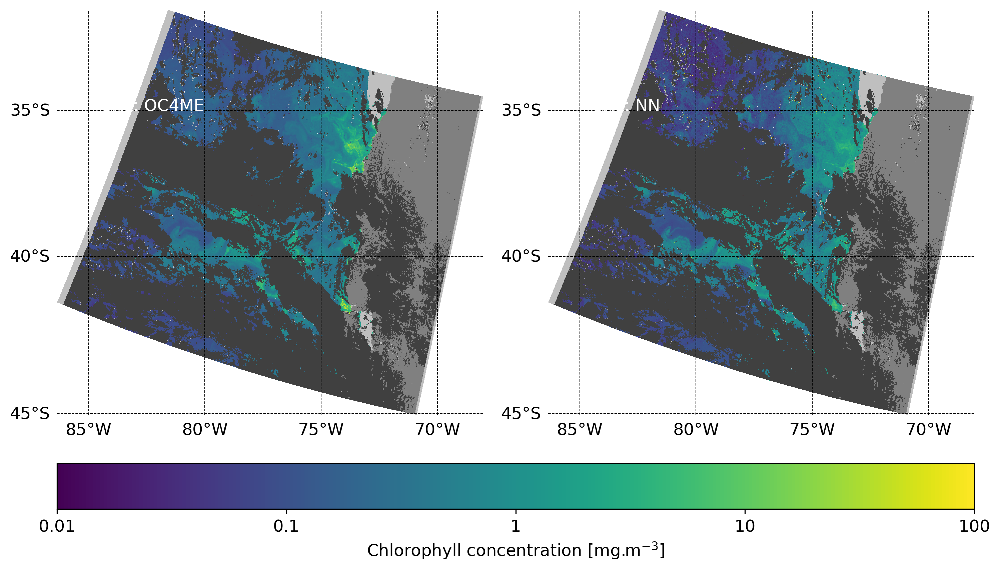

In [11]:
fig, axs = plt.subplots(1, 2, figsize=(10, 10), dpi=300, subplot_kw={"projection": ccrs.Mercator()})

for m, var, cmap, all_mask in zip(axs.reshape(-1),
                         ['CHL_OC4ME', 'CHL_NN'],
                         ['viridis','viridis'],[BAC_mask, NN_mask]):
    
    p1 = m.pcolormesh(lon, lat, band_vars[var][::grid_reduce, ::grid_reduce], transform=ccrs.PlateCarree(), 
                       cmap=cmap, vmin=-2, vmax=2, zorder=1)

    m.contourf(lon, lat, all_mask, levels=[0,1], transform=ccrs.PlateCarree(), colors='0.75', zorder=2)
    m.contourf(lon, lat, cloud_mask, levels=[0,1], transform=ccrs.PlateCarree(), colors='0.25', zorder=3)
    m.contourf(lon, lat, land_mask, levels=[0,1], transform=ccrs.PlateCarree(), colors='0.5', zorder=4)

    m.annotate(f"{var.replace('_',': ')}", xy=(0.1, 0.75), xycoords='axes fraction',
            transform=ccrs.PlateCarree(), zorder=30, color='w')

    # Embellish with gridlines
    g1 = m.gridlines(draw_labels = True, zorder=20, color='0.0', linestyle='--', linewidth=0.5)
    g1.xlocator = mticker.FixedLocator(np.arange(-180, 180, 5))
    g1.ylocator = mticker.FixedLocator(np.arange(-90, 90, 5))
    g1.top_labels = False
    g1.right_labels = False
    g1.xlabel_style = {'color': 'black'}
    g1.ylabel_style = {'color': 'black'}
    m.set(facecolor = "1.0")
    m.axis('off')

plt.tight_layout()

cbar = fig.colorbar(p1, ax=axs[:], location='bottom', pad=0.05)
ticks = [-2,-1,0,1,2]
cbar.set_ticks(ticks)
cbar.set_ticklabels([10**tick for tick in ticks])
cbar.set_label('Chlorophyll concentration [mg.m$^{-3}$]')
plt.savefig('1_6_OLCI_CHL.png', bbox_inches='tight')

1.7 Assessing the light environment

In [1]:
import cartopy.crs as ccrs          # a library that support mapping
import glob                         # a library that aids in searching for files
import matplotlib.pyplot as plt     # a library that support plotting
import matplotlib.ticker as mticker # a library that extends plotting support
import numpy as np                  # a library that provides support for array-based mathematics
import os                           # a library that allows us access to basic operating system commands like making directories
import warnings                     # a library that helps us manage warnings
import xarray as xr                 # a library that supports the use of multi-dimensional arrays in Python
import cmocean                      # a library that provides colour maps for oceanography
import eumartools                   # a EUMETSAT library that support working with Sentinel-3 products
warnings.filterwarnings('ignore')

# set plot font size
plt.rcParams.update({'font.size': 12})

In [2]:
SAFE_directory = os.path.join(os.getcwd(), 'products', 
    'S3B_OL_2_WFR____20240107T142341_20240107T142641_20240108T205019_0179_088_167_3600_MAR_O_NT_003.SEN3/S3B_OL_2_WFR____20240107T142341_20240107T142641_20240108T205019_0179_088_167_3600_MAR_O_NT_003.SEN3')

In [3]:
flag_file = os.path.join(SAFE_directory,'wqsf.nc')

In [4]:
grid_reduce = 5

In [5]:
geo_file = os.path.join(SAFE_directory,'geo_coordinates.nc')
geo_fid = xr.open_dataset(geo_file)
lon = geo_fid.longitude.data[::grid_reduce, ::grid_reduce]
lat = geo_fid.latitude.data[::grid_reduce, ::grid_reduce]
geo_fid.close()

In [6]:
# reading masks: example land
land_mask = eumartools.flag_mask(flag_file, 'WQSF', ['LAND'])
land_mask = land_mask.astype(float)[::grid_reduce, ::grid_reduce]
land_mask[land_mask == 0.0] = np.nan

In [7]:
# reading masks: example cloud
cloud_mask = eumartools.flag_mask(flag_file, 'WQSF', ['CLOUD', 'CLOUD_AMBIGUOUS', 'CLOUD_MARGIN'])
cloud_mask = cloud_mask.astype(float)[::grid_reduce, ::grid_reduce]
cloud_mask[cloud_mask == 0.0] = np.nan

In [8]:
# reading masks: PAR recommended
PAR_mask = eumartools.flag_mask(flag_file, 'WQSF', ['LAND', 'CLOUD', 'CLOUD_AMBIGUOUS', 'CLOUD_MARGIN', 
                                                    'INVALID', 'COSMETIC', 'SATURATED', 'SUSPECT',
                                                    'HISOLZEN', 'HIGHGLINT', 'SNOW_ICE', 'AC_FAIL',
                                                    'WHITECAPS', 'ADJAC', 'RWNEG_O2', 'RWNEG_O3',
                                                    'RWNEG_O4', 'RWNEG_O5', 'RWNEG_O6', 'RWNEG_O7', 'RWNEG_O8',
                                                    'PAR_FAIL'])
PAR_mask = PAR_mask.astype(float)[::grid_reduce, ::grid_reduce]
PAR_mask[PAR_mask == 0.0] = np.nan

In [9]:
band_vars = xr.open_mfdataset(glob.glob(os.path.join(SAFE_directory,'par.nc')))
band_vars.close()

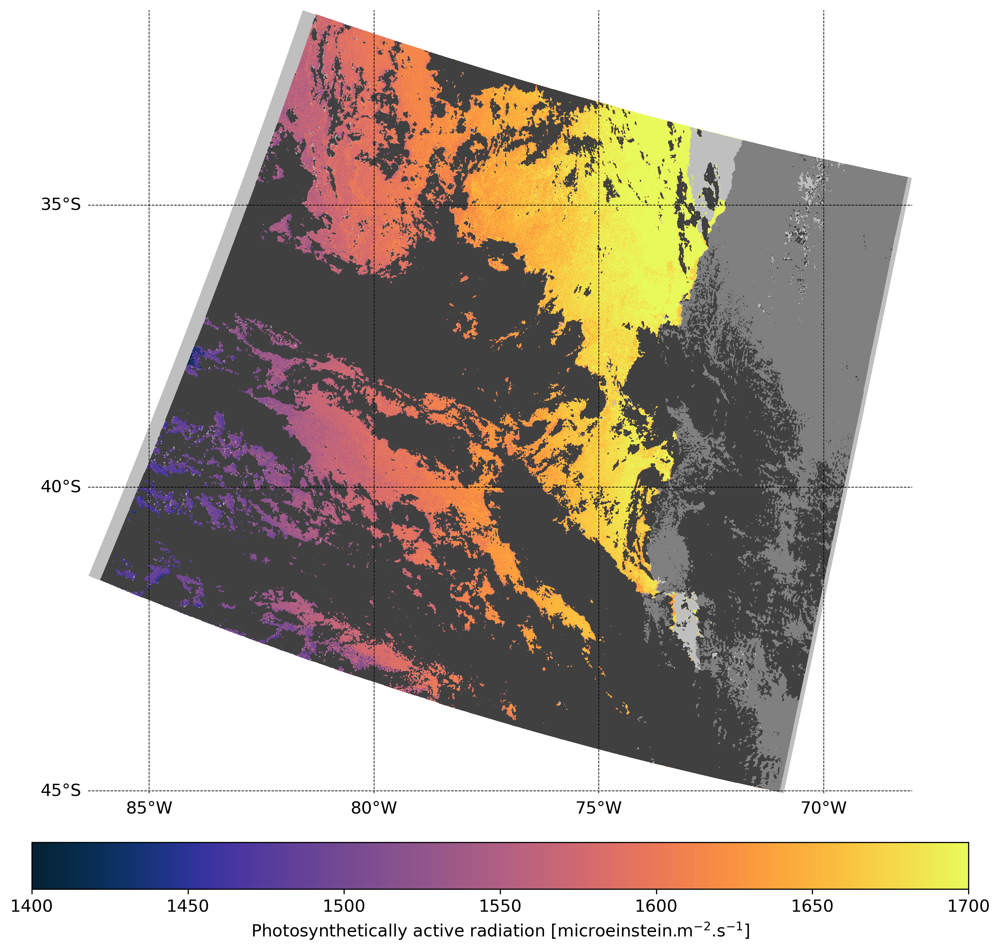

In [10]:
fig = plt.figure(figsize=(10, 10), dpi=300)
m = plt.subplot(projection=ccrs.Mercator())

p1 = m.pcolormesh(lon, lat, band_vars["PAR"][::grid_reduce, ::grid_reduce], transform=ccrs.PlateCarree(), 
                   cmap=cmocean.cm.thermal, vmin=1400, vmax=1700, zorder=1)

m.contourf(lon, lat, PAR_mask, levels=[0,1], transform=ccrs.PlateCarree(), colors='0.75', zorder=2)
m.contourf(lon, lat, cloud_mask, levels=[0,1], transform=ccrs.PlateCarree(), colors='0.25', zorder=3)
m.contourf(lon, lat, land_mask, levels=[0,1], transform=ccrs.PlateCarree(), colors='0.5', zorder=4)

# Embellish with gridlines
g1 = m.gridlines(draw_labels = True, zorder=20, color='0.0', linestyle='--',linewidth=0.5)
g1.xlocator = mticker.FixedLocator(np.arange(-180, 180, 5))
g1.ylocator = mticker.FixedLocator(np.arange(-90, 90, 5))
g1.top_labels = False
g1.right_labels = False
g1.xlabel_style = {'color': 'black'}
g1.ylabel_style = {'color': 'black'}
m.set(facecolor = "1.0")
m.axis('off')

cbar = fig.colorbar(p1, location='bottom', pad=0.05)
cbar.set_label('Photosynthetically active radiation [microeinstein.m$^{-2}$.s$^{-1}$]')

plt.tight_layout()
plt.savefig('1_7_OLCI_PAR.png', bbox_inches='tight')